# Testing of new infrastructure in sandbox.py

In [1]:
import os,sys
#sys.path.append('/home/miguel/PycharmProjects/open_AR_Sandbox')
sys.path.append('..')
sys.path.append('../../../gempy-1.16/')
sys.path.append("/Users/simon/Documents/coding/git/gempy")
sys.path.append('../../sandbox')

import matplotlib.pyplot as plt

import sandbox as sb
import sandbox_new as sbn

#import gempy as gp
#import gempy_sandbox as gpsb
from PIL import Image, ImageDraw
import pickle
import numpy as np
#from time import sleep
#import threading

../../sandbox/sandbox.py:11: RuntimeWarning: Two kernels cannot access the kinect at the same time. This will lead to a sudden death of the kernel. Be sure no other kernel is running before initialize a kinect object.
  'Be sure no other kernel is running before initialize a kinect object.', RuntimeWarning)
/home/sid/.miniconda/lib/python3.6/site-packages/gempy/plotting/visualization.py:36: UserWarning: Steno 3D package is not installed. No 3D online visualization available.
  warnings.warn('Steno 3D package is not installed. No 3D online visualization available.')
/home/sid/.miniconda/lib/python3.6/site-packages/gempy/data_management.py:34: UserWarning: qgrid package is not installed. No interactive dataframes available.
  warnings.warn('qgrid package is not installed. No interactive dataframes available.')
/home/sid/.miniconda/lib/python3.6/site-packages/gempy/posterior_analysis.py:24: UserWarning: pymc (v2) package is not installed. No support for stochastic simulation posterior ana

JSON configuration loaded.
DummySensor initialized.


<Figure size 432x288 with 0 Axes>

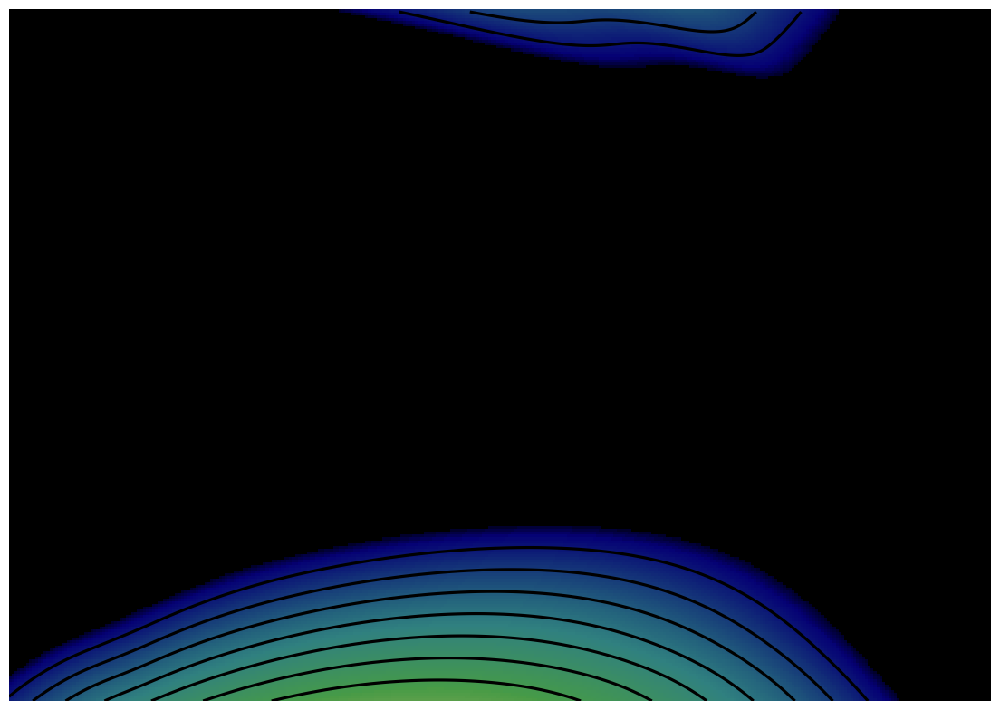

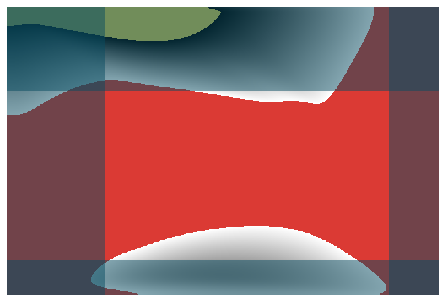

In [2]:
box = sb.Sandbox(calibration_file='calibration.json', sensor='dummy', cmap='gist_earth_r')

In [3]:
box.module.update()

In [4]:
box.module.run()

Thread started...


In [5]:
box.module.stop()

Thread stopped.


### Sensor Test

In [4]:
calib = sb.CalibrationData(file='calibration.json')

JSON configuration loaded.


In [5]:
projector = sb.Projector(calib)

<Figure size 432x288 with 0 Axes>

In [6]:
sensor = sb.DummySensor(calibrationdata=calib, depth_limits=(500,2000))

DummySensor initialized.


In [7]:
#sensor = sb.KinectV2(calib)

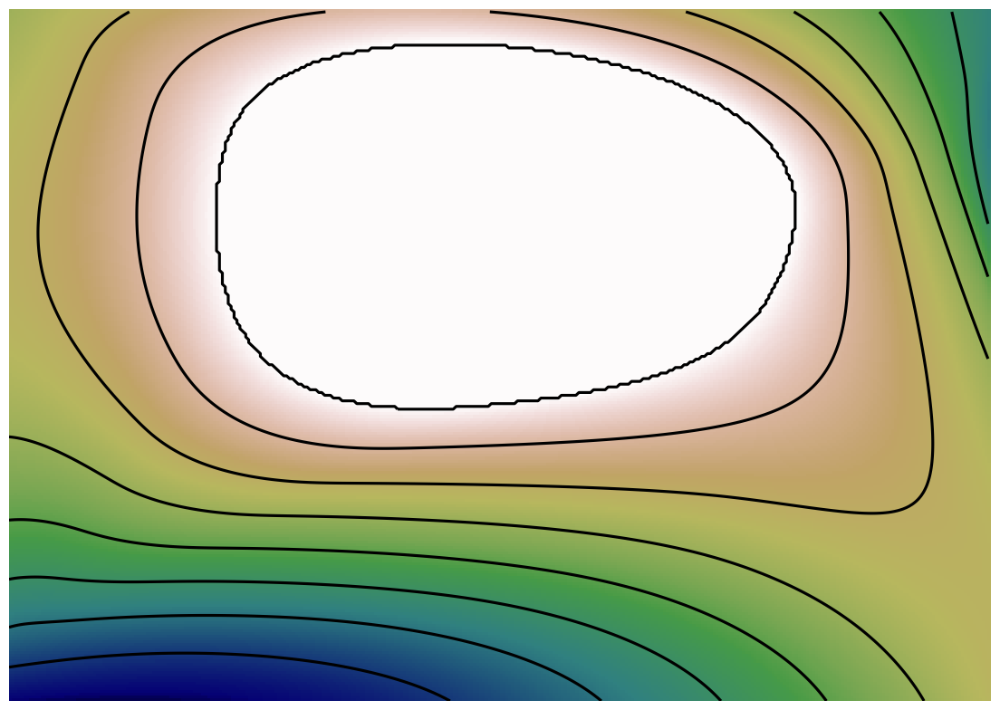

In [8]:
module = sb.TopoModule(calib, sensor, projector, crop=True, cmap='gist_earth_r')

In [9]:
module.update()

In [10]:
module.run()

Thread started...


In [11]:
module.stop()

Thread stopped.


### Calibration

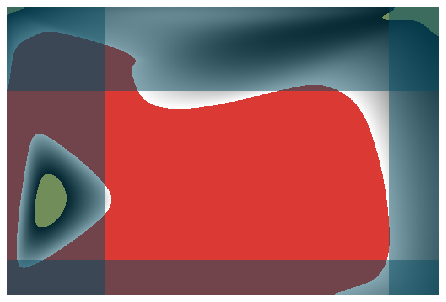

In [11]:
calibration = sb.Calibration(calib, sensor, projector)

In [12]:
calibration.calibrate_projector()

Column
    [0] Markdown(str)
    [1] IntSlider(end=200, name='Top margin', value=25)
    [2] IntSlider(end=200, name='Left margin', value=52)
    [3] IntSlider(end=1884, name='Map width', start=684, value=1084)
    [4] IntSlider(end=1564, name='Map height', start=364, value=764)

### Sensor Calibration

Row
    [0] Matplotlib(Figure)
    [1] Column
        [0] IntSlider(end=424, name='Sensor top margin', value=124)
        [1] IntSlider(end=512, name='Sensor right margin', value=60)
        [2] IntSlider(end=424, name='Sensor bottom margin', value=51)
        [3] IntSlider(end=512, name='Sensor left margin', value=116)
        [4] IntSlider(end=2000, name='Sensor minimum', value=700)
        [5] IntSlider(end=2000, name='Sensor maximum', value=1500)
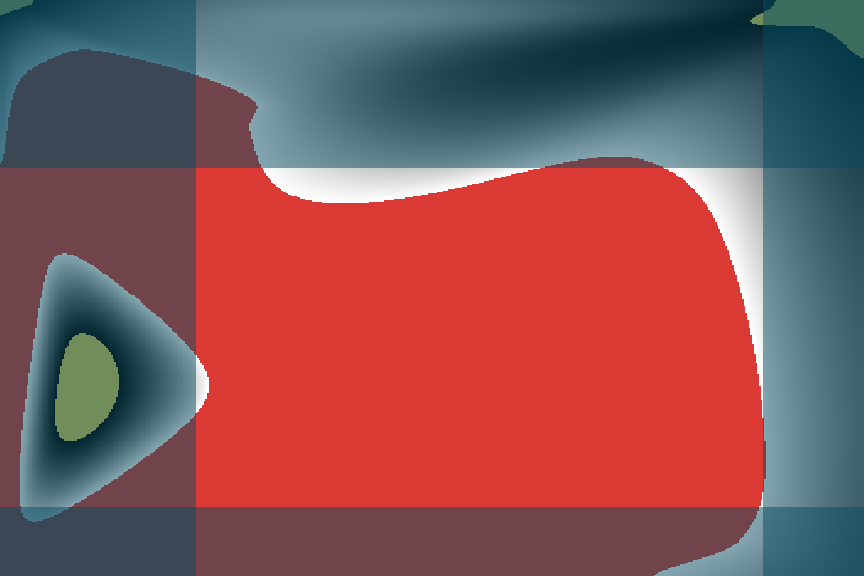

In [13]:
calibration.calibrate_sensor()

In [14]:
frame = sensor.get_frame()
cropped_frame = module.crop_frame(sensor.get_frame())

In [15]:
cropped_frame.shape

(249, 336)

In [16]:
calib.s_frame_height, calib.s_frame_width

(249, 336)

In [17]:
calib.scale_factor

(3.2261904761904763, 3.068273092369478)

### Save calibration

In [18]:
calib.__dict__

{'version': '0.8alpha',
 'p_width': 1280,
 'p_height': 800,
 'p_frame_top': 25,
 'p_frame_left': 52,
 'p_frame_width': 1084,
 'p_frame_height': 764,
 's_name': 'dummy',
 's_width': 512,
 's_height': 424,
 's_top': 124,
 's_right': 60,
 's_bottom': 51,
 's_left': 116,
 's_min': 700,
 's_max': 1500}

In [17]:
calib.save_json()

JSON configuration file saved: calibration.json
